In [26]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc
import squidpy as sq
import argparse
import gpflow
import tensorflow as tf
from GPcounts.RNA_seq_GP import rna_seq_gp
import statsmodels.formula.api as smf 
import statsmodels.api as sm
import simstpy as sim


In [27]:
Y = pd.read_csv(r"C:\Users\User\GPcounts\GPcounts\demo_notebooks\ut_D3_stdata_filtered.tsv", index_col=[0], sep="\t")
Y = Y.T[Y.sum(0) >= 3].T


In [28]:
Y

,FO538757.1,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,DKC1,MPP1,F8A1,F8,FUNDC2,BRCC3,VBP1,CLIC2,SPRY3,VAMP7
10x10,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10x11,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,2,0,0,0,0,0
10x12,1,1,0,0,0,0,3,4,0,0,...,0,0,0,0,0,0,0,0,0,1
10x13,2,1,0,0,0,0,7,8,0,0,...,1,0,0,0,0,0,0,0,0,0
10x14,0,1,1,0,0,0,3,0,0,0,...,0,0,0,0,0,0,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9x23,0,1,1,0,0,0,2,4,0,0,...,0,0,0,0,0,0,0,0,0,0
9x24,1,0,2,0,0,0,3,5,1,0,...,0,0,0,0,0,0,0,1,0,0
9x25,0,0,1,1,0,0,1,5,0,0,...,0,0,0,0,0,0,0,0,0,0
9x26,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [29]:
spatial_locations = pd.DataFrame(index=Y.index)
spatial_locations['x'] = Y.index.str.split('x').str.get(0).map(float)
spatial_locations['y'] = Y.index.str.split('x').str.get(1).map(float)
spatial_locations['total_counts'] = Y.sum(1)


In [30]:
spatial_locations['total_counts']

10x10     4884
10x11     3242
10x12     6102
10x13    10911
10x14     4524
         ...  
9x23      2426
9x24      4728
9x25      7860
9x26      5325
9x27      1906
Name: total_counts, Length: 301, dtype: int64

In [31]:
Y

,FO538757.1,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,DKC1,MPP1,F8A1,F8,FUNDC2,BRCC3,VBP1,CLIC2,SPRY3,VAMP7
10x10,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10x11,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,2,0,0,0,0,0
10x12,1,1,0,0,0,0,3,4,0,0,...,0,0,0,0,0,0,0,0,0,1
10x13,2,1,0,0,0,0,7,8,0,0,...,1,0,0,0,0,0,0,0,0,0
10x14,0,1,1,0,0,0,3,0,0,0,...,0,0,0,0,0,0,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9x23,0,1,1,0,0,0,2,4,0,0,...,0,0,0,0,0,0,0,0,0,0
9x24,1,0,2,0,0,0,3,5,1,0,...,0,0,0,0,0,0,0,1,0,0
9x25,0,0,1,1,0,0,1,5,0,0,...,0,0,0,0,0,0,0,0,0,0
9x26,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [32]:
scales = []
for i in range(0, len(Y.columns)):
    model=smf.glm(formula = "Y.iloc[:, i]~0+spatial_locations['total_counts']", 
                      data=Y, 
                      family=sm.families.NegativeBinomial(sm.families.links.identity())).fit()
    res = model.params[0]*spatial_locations['total_counts']
    scales.append(res)

scalesdf=pd.DataFrame(scales)
scalesdf=scalesdf.T

c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\families\links.py:13: FutureWarning: The identity link alias is deprecated. Use Identity instead. The identity link alias will be removed after the 0.15.0 release.
  warnings.warn(
c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The identity link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\AppData\Local\Temp\ipykernel_4832\334389229.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

In [33]:
scalesdf

,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,...,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts,total_counts
10x10,0.194130,0.471224,0.511577,0.156087,0.030506,0.014738,2.596964,3.688217,0.233881,0.007437,...,0.240516,0.040338,0.012364,0.007444,0.294215,0.071352,0.144887,0.034526,0.009916,0.135485
10x11,0.128863,0.312798,0.339585,0.103611,0.020250,0.009783,1.723865,2.448239,0.155250,0.004937,...,0.159655,0.026776,0.008207,0.004942,0.195300,0.047363,0.096176,0.022918,0.006582,0.089935
10x12,0.242543,0.588740,0.639157,0.195013,0.038113,0.018413,3.244610,4.608005,0.292208,0.009291,...,0.300497,0.050397,0.015447,0.009301,0.367589,0.089146,0.181020,0.043136,0.012389,0.169272
10x13,0.433691,1.052727,1.142878,0.348703,0.068150,0.032924,5.801694,8.239585,0.522497,0.016614,...,0.537320,0.090116,0.027621,0.016631,0.657286,0.159402,0.323682,0.077132,0.022152,0.302676
10x14,0.179820,0.436490,0.473869,0.144582,0.028257,0.013651,2.405542,3.416358,0.216642,0.006889,...,0.222788,0.037364,0.011453,0.006896,0.272529,0.066092,0.134207,0.031981,0.009185,0.125498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9x23,0.096429,0.234068,0.254113,0.077532,0.015153,0.007320,1.289974,1.832026,0.116174,0.003694,...,0.119470,0.020037,0.006141,0.003698,0.146144,0.035442,0.071969,0.017150,0.004925,0.067298
9x24,0.187929,0.456172,0.495237,0.151101,0.029531,0.014267,2.514014,3.570411,0.226411,0.007199,...,0.232834,0.039049,0.011969,0.007207,0.284818,0.069073,0.140259,0.033423,0.009599,0.131157
9x25,0.312420,0.758357,0.823300,0.251197,0.049094,0.023718,4.179389,5.935582,0.376393,0.011968,...,0.387071,0.064917,0.019898,0.011980,0.473492,0.114829,0.233172,0.055564,0.015958,0.218040
9x26,0.211658,0.513773,0.557770,0.170181,0.033260,0.016068,2.831456,4.021244,0.254999,0.008108,...,0.262234,0.043980,0.013480,0.008117,0.320782,0.077795,0.157969,0.037643,0.010811,0.147718


In [34]:
Y

,FO538757.1,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,DKC1,MPP1,F8A1,F8,FUNDC2,BRCC3,VBP1,CLIC2,SPRY3,VAMP7
10x10,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10x11,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,2,0,0,0,0,0
10x12,1,1,0,0,0,0,3,4,0,0,...,0,0,0,0,0,0,0,0,0,1
10x13,2,1,0,0,0,0,7,8,0,0,...,1,0,0,0,0,0,0,0,0,0
10x14,0,1,1,0,0,0,3,0,0,0,...,0,0,0,0,0,0,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9x23,0,1,1,0,0,0,2,4,0,0,...,0,0,0,0,0,0,0,0,0,0
9x24,1,0,2,0,0,0,3,5,1,0,...,0,0,0,0,0,0,0,1,0,0
9x25,0,0,1,1,0,0,1,5,0,0,...,0,0,0,0,0,0,0,0,0,0
9x26,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [35]:
Y = Y.iloc[:,80:100]
Y1 = Y.T
X = spatial_locations[['x', 'y']]
gene_name = Y1.index

In [38]:
Y1

,10x10,10x11,10x12,10x13,10x14,10x15,10x16,10x17,10x18,10x19,...,9x18,9x19,9x20,9x21,9x22,9x23,9x24,9x25,9x26,9x27
THAP3,0,0,0,0,0,0,1,0,1,1,...,0,2,0,1,0,1,0,0,0,0
DNAJC11,0,0,0,1,1,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
CAMTA1,2,0,0,1,0,0,1,0,0,0,...,3,3,0,0,1,0,0,0,0,0
VAMP3,0,0,1,0,0,0,1,0,0,1,...,1,2,1,1,1,0,1,2,0,0
PER3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
TNFRSF9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PARK7,2,1,5,2,0,1,1,1,1,1,...,1,3,1,4,5,0,0,1,2,1
ERRFI1,0,0,1,1,0,0,1,0,0,0,...,1,1,0,2,0,0,0,0,0,0
SLC45A1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
RERE,1,0,1,2,1,0,1,1,1,0,...,3,2,1,2,1,0,1,0,1,0


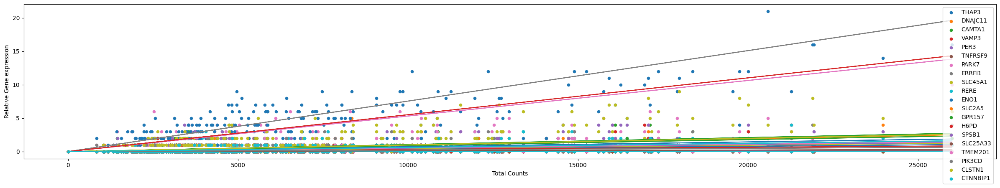

In [40]:


plt.figure().set_figwidth(30)
plt.xlabel("Total Counts")
plt.ylabel("Relative Gene expression")
for i in range(len(Y1)):
    plt.scatter(spatial_locations['total_counts'], Y1.iloc[i], s=20, label=Y1.index[i])
    plt.plot(spatial_locations['total_counts'], scalesdf.T.iloc[i])
    plt.legend()
plt.show();

In [43]:
gp_counts = rna_seq_gp(X, Y1.loc[gene_name], sparse=True, scale=scalesdf, safe_mode=False)


In [44]:
log_likelihood_ratio = gp_counts.One_sample_test("Negative_binomial")

  0%|          | 0/20 [00:00<?, ?it/s]

model 1 log likelihood = -177.9449006305971, alpha = None, km = 0.10911242900071925


  5%|▌         | 1/20 [00:05<01:42,  5.37s/it]

results: [-177.9449006305971, -179.4093732722023, 1.464472641605198]
model 1 log likelihood = -225.54739345628008, alpha = None, km = 0.3278102086893798


 10%|█         | 2/20 [00:10<01:30,  5.02s/it]

results: [-225.54739345628008, -226.45847458485005, 0.9110811285699754]
model 1 log likelihood = -213.51445257987712, alpha = None, km = 0.4074834982114727


 15%|█▌        | 3/20 [00:14<01:20,  4.72s/it]

results: [-213.51445257987712, -216.3444636045918, 2.830011024714679]
model 1 log likelihood = -205.5134462627562, alpha = None, km = 3.5727632295694743e-10


 20%|██        | 4/20 [00:19<01:16,  4.78s/it]

results: [-205.5134462627562, -205.3770254832667, -0.13642077948949805]
model 1 log likelihood = -106.0997393814803, alpha = None, km = 2.048791140224587


 25%|██▌       | 5/20 [00:23<01:10,  4.68s/it]

results: [-106.0997393814803, -107.99496849520203, 1.8952291137217259]
model 1 log likelihood = -41.531653396552954, alpha = None, km = 0.00013698817016081548


 30%|███       | 6/20 [00:27<01:01,  4.38s/it]

results: [-41.531653396552954, -41.494238817464726, -0.037414579088228095]
model 1 log likelihood = -432.99013829108435, alpha = None, km = 0.21483998393033457


 35%|███▌      | 7/20 [00:32<00:59,  4.57s/it]

results: [-432.99013829108435, -433.6897050887979, 0.699566797713544]
model 1 log likelihood = -147.52133888736057, alpha = None, km = 0.3769117114278933


 40%|████      | 8/20 [00:39<01:04,  5.39s/it]

results: [-147.52133888736057, -147.5210692740828, -0.0002696132777657567]
model 1 log likelihood = -14.219971739717465, alpha = None, km = 2.994804121837646e-15


 45%|████▌     | 9/20 [00:44<00:58,  5.30s/it]

results: [-14.219971739717465, -30.105692150487695, 15.88572041077023]
model 1 log likelihood = -222.6632600485786, alpha = None, km = 2.3714273083104554e-05


 50%|█████     | 10/20 [00:50<00:53,  5.30s/it]

results: [-222.6632600485786, -224.15073787601585, 1.4874778274372602]
model 1 log likelihood = -618.0174348972927, alpha = None, km = 0.04907033093600566


 55%|█████▌    | 11/20 [00:58<00:55,  6.15s/it]

results: [-618.0174348972927, -618.1655309222164, 0.14809602492368867]
model 1 log likelihood = -91.66818654287282, alpha = None, km = 1.0242775820580612


 60%|██████    | 12/20 [01:03<00:46,  5.75s/it]

results: [-91.66818654287282, -91.68643927716408, 0.018252734291266393]
model 1 log likelihood = -118.47382418430226, alpha = None, km = 0.3626558085488037


 65%|██████▌   | 13/20 [01:08<00:39,  5.68s/it]

results: [-118.47382418430226, -118.47379540255152, -2.878175074272349e-05]
model 1 log likelihood = -141.73559711522654, alpha = None, km = 4.6125134836795926e-10


 70%|███████   | 14/20 [01:17<00:40,  6.73s/it]

results: [-141.73559711522654, -141.65207675693952, -0.08352035828701787]
model 1 log likelihood = -292.7871963455289, alpha = None, km = 0.07033438391631697


 75%|███████▌  | 15/20 [01:25<00:35,  7.15s/it]

results: [-292.7871963455289, -292.7871845722515, -1.1773277435622731e-05]
model 1 log likelihood = -66.94018785015962, alpha = None, km = 4.7618943097821714e-08


 80%|████████  | 16/20 [01:30<00:25,  6.44s/it]

results: [-66.94018785015962, -50.86269945257009, -16.077488397589526]
model 1 log likelihood = -138.6654487820341, alpha = None, km = 0.5566101628581147


 85%|████████▌ | 17/20 [01:34<00:17,  5.79s/it]

results: [-138.6654487820341, -141.37457993662554, 2.7091311545914323]
model 1 log likelihood = -257.7187057830696, alpha = None, km = 0.32283147831240605


 90%|█████████ | 18/20 [01:39<00:10,  5.37s/it]

results: [-257.7187057830696, -257.7346267006607, 0.015920917591131456]
model 1 log likelihood = -412.62863708412124, alpha = None, km = 0.00012164669960807944


 95%|█████████▌| 19/20 [01:44<00:05,  5.40s/it]

results: [-412.62863708412124, -411.88639807887625, -0.7422390052449828]
model 1 log likelihood = -172.6076287046595, alpha = None, km = 1.2767962066000623e-10


100%|██████████| 20/20 [01:49<00:00,  5.48s/it]

results: [-172.6076287046595, -172.53103030044994, -0.07659840420956243]


In [45]:
log_likelihood_ratio

,Dynamic_model_log_likelihood,Constant_model_log_likelihood,log_likelihood_ratio
THAP3,-177.944901,-179.409373,1.464473
DNAJC11,-225.547393,-226.458475,0.911081
CAMTA1,-213.514453,-216.344464,2.830011
VAMP3,-205.513446,-205.377025,-0.136421
PER3,-106.099739,-107.994968,1.895229
TNFRSF9,-41.531653,-41.494239,-0.037415
PARK7,-432.990138,-433.689705,0.699567
ERRFI1,-147.521339,-147.521069,-0.000270
SLC45A1,-14.219972,-30.105692,15.885720
RERE,-222.663260,-224.150738,1.487478


In [46]:
results = gp_counts.calculate_FDR(log_likelihood_ratio)
results

c:\Users\User\GPcounts\.venv\lib\site-packages\GPcounts\RNA_seq_GP.py:418: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  pv = pv.ravel()  # flattens the array in place, more efficient than flatten()


,Dynamic_model_log_likelihood,Constant_model_log_likelihood,log_likelihood_ratio,p_value,q_value
THAP3,-177.944901,-179.409373,1.464473,8.700432e-02,2.900144e-01
DNAJC11,-225.547393,-226.458475,0.911081,1.770561e-01,5.058746e-01
CAMTA1,-213.514453,-216.344464,2.830011,1.735590e-02,1.328479e-01
VAMP3,-205.513446,-205.377025,-0.136421,1.000000e+00,1.000000e+00
PER3,-106.099739,-107.994968,1.895229,5.154554e-02,2.577277e-01
TNFRSF9,-41.531653,-41.494239,-0.037415,1.000000e+00,1.000000e+00
PARK7,-432.990138,-433.689705,0.699567,2.368687e-01,5.921717e-01
ERRFI1,-147.521339,-147.521069,-0.000270,1.000000e+00,1.000000e+00
SLC45A1,-14.219972,-30.105692,15.885720,1.734242e-08,3.468483e-07
RERE,-222.663260,-224.150738,1.487478,8.456244e-02,2.900144e-01
